In [1]:
%cd ..
%load_ext autoreload
%autoreload 2

import imageio
from PIL import Image
from itertools import product

from datasets.PyKitti2Dataset import PyKitti2
from datasets.MultiSenseDataset import *
from AutoCalibration import *

/home/ios/git_repos/rgbd-registration
Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
%pwd

'/home/ios/git_repos/rgbd-registration'

# Stereo

In [3]:
BASE_DIR = "/home/ios/data3_/multisense_stereo/"

ds = MultiSenseData(BASE_DIR, rectified=True, crop=[0 ,0, -1, -1], preload=True)
velo, cam_left, cam_right, _ = ds[450]
datas = [ds]
ds

MultiSenseData(base_path=/home/ios/data3_/multisense_stereo/)[472]

In [4]:
ds.calib.T_cam2_velo, np.load("/home/ios/data3/multisense_stereo/TR_icp.npy")

(array([[ 0.        , -1.        ,  0.        , -0.8       ],
        [ 0.        ,  0.        , -1.        , -0.1       ],
        [ 1.        ,  0.        ,  0.        , -0.05198033],
        [ 0.        ,  0.        ,  0.        ,  1.        ]]),
 array([[ 0.03566195, -0.00426961,  0.99935555,  0.12735982],
        [-0.99933445,  0.00763369,  0.03569377,  0.48986836],
        [-0.00778116, -0.99996364, -0.00399454,  0.00617393],
        [ 0.        ,  0.        ,  0.        ,  1.        ]]))

In [5]:
cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")
cal

array([[ 0.01898612, -0.99988598, -0.0018358 ,  0.77094674],
       [-0.00860701,  0.0016725 , -1.00001872,  0.07409772],
       [ 0.99983376,  0.01900097, -0.00857363, -0.10914795],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

In [14]:
r = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")[:3, :3]
r = Rot.from_matrix(r)
r.as_euler("zyx", degrees=True)

array([88.91391615, -0.10724531, 90.4900717 ])

In [217]:
eye = np.eye(3)
eye[:3, 0] = np.array([0, 0, 1])
eye[:3, 1] = np.array([-1, 0, 0])
eye[:3, 2] = np.array([0, -1, 0])

euler_diff(eye, np.load("calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")[:3, :3])

array([ 0.49130758,  1.08869912, -0.09584377])

In [207]:
np.linalg.norm([ 0.49130758,  1.08869912, -0.09584377]), quat_diff(eye, np.load("calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")[:3, :3])

(1.1982633017421687, 1.1967617259465606)

In [36]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         M=24,       
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2,
                         mode="euclidean",
                         rgb_channels=3,
                        )
    ac.to("cuda")
    
    res = None
    retry_c = 0
    r, t = randomRT(0.02, 1.30)
    q, mse = quat_diff(Rot.from_euler('xyz', r, degrees=True).as_matrix(), np.eye(3)), np.linalg.norm(t)
    print(r, t)
    print(q, mse)
    
    def not_converged(max_tries=5):
        global retry_c 
        retry_c = retry_c + 1
        return res is None and retry_c <= max_tries
        
    while not_converged():
        
        ac.load_and_reset("checkpoints/mi_model_p96_small_rgb.pth.tar")
        ac.reset_calibration()
        ac.distort_calibration(t, r)

        ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
        
        res = ac.fit(datas, iters=100, log_interval=10, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
        
    res = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    
    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    res = ac.fit(datas, iters=100, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
    
    log.append(res)
    print("\n########################################\n")
    
t, r = np.asarray([l[-1]["t_l2"].tail(1).item() for l in log]), np.asarray([l[-1]["Q_cos"].tail(1).item()for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

[ 0.82203757 -0.54707436  0.60612754] [-0.0076041   0.00685811 -0.00115081]
#   0: nll: 1.28/1.03, mi: -3.354/-0.746, acc: 43.8/52.9, eps: 0.02956, R=[0.76, -0.6, 0.55], t=0.01, Q_cos=1.12
Saved checkpoint.
#  10: nll: 0.99/1.02, mi: -0.642/-0.904, acc: 54.2/51.2, eps: 0.00165, R=[0.82, -0.53, 0.4], t=0.01, Q_cos=1.05
#  20: nll: 0.87/1.03, mi:  0.272/-1.036, acc: 54.2/50.8, eps: 0.00716, R=[0.6, -0.35, 0.22], t=0.01, Q_cos=0.73
#  30: nll: 1.07/0.96, mi: -1.586/-0.635, acc: 52.1/55.5, eps: 0.00106, R=[0.49, -0.46, 0.05], t=0.01, Q_cos=0.68
Saved checkpoint.
#  40: nll: 1.00/0.94, mi: -0.504/-0.769, acc: 56.2/57.2, eps: 0.00164, R=[0.55, -0.52, 0.0], t=0.01, Q_cos=0.76
#  50: nll: 0.79/1.00, mi:  0.301/-0.807, acc: 52.1/53.0, eps: 0.00167, R=[0.46, -0.48, -0.13], t=0.01, Q_cos=0.68
#  60: nll: 0.90/0.91, mi: -0.448/-0.632, acc: 52.1/56.6, eps: 0.00197, R=[0.34, -0.4, -0.23], t=0.01, Q_cos=0.58
Saved checkpoint.
#  70: nll: 0.83/0.96, mi:  0.027/-1.015, acc: 54.2/54.1, eps: 0.00002, R=[

Result(mean_t=0.011666173172138444, std_t=0.004907532132840115, median_t=0.01032361871907304, mean_R=0.7233290951177168, std_R=0.5630335211565253, meadian_R=0.6701797324515634)

In [ ]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         M=24,       
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2,
                         mode="euclidean",
                         rgb_channels=3,
                        )
    ac.to("cuda")
    
    res = None
    retry_c = 0
    r, t = randomRT(0.02, 1.30)
    print(r, t)
    
    def not_converged(max_tries=5):
        global retry_c 
        retry_c = retry_c + 1
        return res is None and retry_c <= max_tries
        
    while not_converged():
        
        ac.load_and_reset("checkpoints/mi_model_p96_small_rgb.pth.tar")
        ac.reset_calibration()
        ac.distort_calibration(t, r)

        ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
        
        res = ac.fit(datas, iters=200, log_interval=10, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
        
    res = ac.fit(datas, iters=2500, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    
    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    res = ac.fit(datas, iters=100, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
    
    log.append(res)
    print("\n########################################\n")
    
t, r = np.asarray([l[-1]["t_l2"].tail(1).item() for l in log]), np.asarray([l[-1]["Q_cos"].tail(1).item()for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

In [62]:
from AutoCalibration import *

np.random.seed(13)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         M=24,       
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2,
                         mode="euclidean",
                         rgb_channels=3,
                        )
    ac.to("cuda")
    
    res = None
    retry_c = 0
    r, t = randomRT(0.06, 1.87)
    
    def not_converged(max_tries=5):
        global retry_c 
        retry_c = retry_c + 1
        return res is None and retry_c <= max_tries
        
    while not_converged():
        
        ac.load_and_reset("checkpoints/mi_model_p96_small_rgb.pth.tar")
        ac.reset_calibration()
        ac.distort_calibration(t, r)

        ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
        
        res = ac.fit(datas, iters=250, log_interval=10, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
        
    res = ac.fit(datas, iters=2500, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    
    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    res = ac.fit(datas, iters=100, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
    
    log.append(res)
    print("\n########################################\n")
    
t, r = np.asarray([l[-1]["t_l2"].tail(1).item() for l in log]), np.asarray([l[-1]["Q_cos"].tail(1).item()for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

#   0: nll: 0.89/1.04, mi: -0.508/-1.425, acc: 54.2/50.8, eps: 0.06464, R=[-0.87, -0.39, 0.45], t=0.06, Q_cos=1.05
#  10: nll: 1.07/1.11, mi: -0.648/-0.704, acc: 56.2/54.6, eps: 0.00110, R=[-1.0, -0.55, 0.35], t=0.06, Q_cos=1.19
#  20: nll: 1.21/1.04, mi: -0.659/-0.570, acc: 56.2/57.1, eps: 0.00085, R=[-0.79, -0.41, 0.63], t=0.06, Q_cos=1.09
Not converged.
#   0: nll: 1.00/1.05, mi: -0.953/-1.475, acc: 45.8/51.7, eps: 0.00025, R=[-0.87, -0.39, 0.45], t=0.06, Q_cos=1.05
#  10: nll: 1.03/1.12, mi: -0.275/-0.996, acc: 52.1/50.4, eps: 0.00042, R=[-0.74, -0.31, 0.56], t=0.06, Q_cos=0.98
#  20: nll: 0.94/1.08, mi: -0.271/-0.583, acc: 60.4/55.0, eps: 0.00081, R=[-0.93, -0.39, 0.42], t=0.06, Q_cos=1.09
Not converged.
#   0: nll: 1.12/1.08, mi: -1.178/-0.999, acc: 52.1/51.7, eps: 0.00006, R=[-0.87, -0.51, 0.45], t=0.06, Q_cos=1.10
#  10: nll: 0.95/1.11, mi: -0.852/-1.198, acc: 56.2/52.5, eps: 0.00153, R=[-0.82, -0.25, 0.85], t=0.06, Q_cos=1.21
#  20: nll: 1.25/1.08, mi: -1.393/-1.085, acc: 45.8

Result(mean_t=0.04281951609041525, std_t=0.013123290083018166, median_t=0.03962267028068459, mean_R=0.6963771083405867, std_R=0.514971303244386, meadian_R=0.657644502535895)

In [22]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_recentered.npy")
    
    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         M=24,
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2,
                         mode="euclidean",
                         rgb_channels=1,
                         pc_batch=5000)
    ac.to("cuda")
    
    r, t = randomRT(0.02, 2.)
    
    ac.load_and_reset("checkpoints/mi_model_p96_small_registered_3999.pth.tar")

    print(r ,t)
    ac.distort_calibration(t, r)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    res = ac.fit(datas, iters=10, log_interval=10, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.increase_lr()
    res = ac.fit(datas, iters=2500, log_interval=10, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.reduce_lr()
    res = ac.fit(datas, iters=100, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)
    
    log.append(res)
    print("\n########################################\n")
    
t, r = np.asarray([l[-1]["t_l2"].tail(1).item() for l in log]), np.asarray([l[-1]["Q_cos"].tail(1).item()for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

[ 1.26467319 -0.84165287  0.93250391] [-0.0076041   0.00685811 -0.00115081]
#   0: nll: 1.07/1.01, mi: -1.251/-0.884, acc: 43.8/52.8, eps: 0.04507, R=[1.26, -0.84, 0.93], t=0.01, Q_cos=1.78
Saved checkpoint.
#   0: nll: 1.08/1.00, mi: -0.753/-1.133, acc: 50.0/52.9, eps: 0.00206, R=[1.19, -0.82, 0.87], t=0.01, Q_cos=1.69
Saved checkpoint.
#  10: nll: 0.96/0.97, mi: -0.320/-0.813, acc: 54.2/52.9, eps: 0.00712, R=[1.0, -0.58, 0.77], t=0.01, Q_cos=1.39
Saved checkpoint.
#  20: nll: 0.84/1.05, mi:  0.319/-0.822, acc: 66.7/51.5, eps: 0.00106, R=[1.09, -0.34, 0.88], t=0.01, Q_cos=1.45
#  30: nll: 1.23/1.01, mi: -1.014/-0.708, acc: 50.0/54.0, eps: 0.00063, R=[1.13, -0.09, 0.94], t=0.01, Q_cos=1.48
#  40: nll: 0.80/0.99, mi:  0.285/-0.891, acc: 60.4/52.9, eps: 0.00184, R=[1.19, 0.02, 1.0], t=0.01, Q_cos=1.56
#  50: nll: 0.96/1.01, mi: -0.235/-0.916, acc: 56.2/52.1, eps: 0.00495, R=[1.06, 0.21, 0.81], t=0.01, Q_cos=1.35
#  60: nll: 1.10/0.98, mi: -1.375/-0.748, acc: 39.6/53.8, eps: 0.00577, R=[0

KeyboardInterrupt: 

In [339]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()
    
    r, t = randomRT(0.001, 2)
    ac.distort_calibration(t, r)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=250, log_interval=50, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=2500, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
    
    log.append(r)
    print("\n########################################\n")

#   0: nll: 0.97/1.09, mi: -0.290/-1.065, acc: 54.2/49.2, eps: 0.04308, R=[1.21, -0.9, 0.88], t=0.00, Q_cos=1.75
#  50: nll: 0.98/1.06, mi: -0.459/-0.724, acc: 47.9/52.9, eps: 0.00229, R=[1.3, -0.35, 0.95], t=0.00, Q_cos=1.65
# 100: nll: 1.23/1.16, mi: -2.042/-1.442, acc: 39.6/47.1, eps: 0.00889, R=[1.12, -0.58, 0.28], t=0.00, Q_cos=1.29
# 150: nll: 1.10/1.13, mi: -0.983/-1.577, acc: 50.0/45.8, eps: 0.01097, R=[1.34, -0.96, 0.54], t=0.00, Q_cos=1.74
# 200: nll: 0.89/0.92, mi: -0.337/-0.307, acc: 54.2/54.6, eps: 0.00311, R=[1.31, -1.31, 0.18], t=0.00, Q_cos=1.86
#   0: nll: 1.37/1.00, mi: -2.290/-0.822, acc: 43.8/49.6, eps: 0.01178, R=[1.34, -0.31, 0.13], t=0.00, Q_cos=1.38
#  50: nll: 0.60/0.69, mi:  0.405/-0.032, acc: 75.0/59.2, eps: 0.00254, R=[1.25, -0.19, 0.17], t=0.00, Q_cos=1.28
# 100: nll: 0.60/0.59, mi:  0.360/ 0.406, acc: 70.8/68.8, eps: 0.00118, R=[1.24, -0.26, 0.39], t=0.00, Q_cos=1.32
# 150: nll: 0.59/0.60, mi:  0.526/ 0.347, acc: 70.8/65.8, eps: 0.00415, R=[1.4, -0.21, 0.4

In [340]:
t, r = np.asarray([l[-1]["t_l2"] for l in log]), np.asarray([l[-1]["Q_cos"] for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

Result(mean_t=0.008730584901466528, std_t=0.004784939294730226, median_t=0.008593963419919375, mean_R=0.6226555191985423, std_R=0.6024687594683217, meadian_R=0.28044054207335767)

In [14]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()
    
    r, t = randomRT(0.02, 1.87)
    ac.distort_calibration(t, r)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=20, log_interval=50, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=2500, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
    
    log.append(r)
    print("\n########################################\n")

#   0: nll: 0.98/1.05, mi: -0.476/-0.962, acc: 47.9/53.3, eps: 0.04018, R=[1.13, -0.73, 0.82], t=0.01, Q_cos=1.57
#   0: nll: 0.88/1.03, mi: -0.401/-1.254, acc: 52.1/47.9, eps: 0.00529, R=[1.45, -0.82, 0.67], t=0.01, Q_cos=1.80
#  50: nll: 0.77/0.69, mi: -0.460/ 0.024, acc: 56.2/58.8, eps: 0.00803, R=[1.29, -0.58, 0.37], t=0.01, Q_cos=1.46
# 100: nll: 0.56/0.64, mi:  0.528/ 0.212, acc: 62.5/60.8, eps: 0.00267, R=[1.22, -0.58, 0.01], t=0.01, Q_cos=1.35
Saved checkpoint
# 150: nll: 0.59/0.57, mi:  0.258/ 0.376, acc: 62.5/71.2, eps: 0.00197, R=[1.24, -0.56, 0.45], t=0.01, Q_cos=1.43
Saved checkpoint
# 200: nll: 0.57/0.60, mi:  0.322/ 0.442, acc: 70.8/69.6, eps: 0.00207, R=[1.19, -0.55, 0.34], t=0.01, Q_cos=1.35
Saved checkpoint
# 250: nll: 0.59/0.57, mi:  0.602/ 0.324, acc: 64.6/68.3, eps: 0.00867, R=[0.78, -0.53, -0.24], t=0.01, Q_cos=0.98
# 300: nll: 0.58/0.56, mi:  0.380/ 0.519, acc: 66.7/70.0, eps: 0.00722, R=[1.21, -0.37, -0.27], t=0.01, Q_cos=1.30
Saved checkpoint
# 350: nll: 0.65/0

In [15]:
t, r = np.asarray([l[-1]["t_l2"] for l in log]), np.asarray([l[-1]["Q_cos"] for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

Result(mean_t=0.01618596560083737, std_t=0.005401340897862691, median_t=0.014893209328771948, mean_R=0.8811437024456141, std_R=0.6272185266129946, meadian_R=0.8048175045856503)

In [16]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    #cal = np.linalg.inv( np.load("/home/ios/data3_/multisense_stereo/TR_icp.npy") )
    #cal = np.linalg.inv( np.load("/home/ios/data3_/multisense_stereo/TR_icp_dist.npy") )
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()
    
    r, t = randomRT(0.04, 1.87)
    ac.distort_calibration(t, r)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=20, log_interval=50, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=2500, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
    
    log.append(r)
    print("\n########################################\n")

#   0: nll: 1.13/1.03, mi: -1.594/-0.780, acc: 47.9/53.7, eps: 0.04713, R=[1.24, -0.73, 0.93], t=0.02, Q_cos=1.72
#   0: nll: 0.99/1.00, mi: -0.663/-0.828, acc: 50.0/54.6, eps: 0.00254, R=[1.35, -0.73, 0.45], t=0.02, Q_cos=1.61
#  50: nll: 0.74/0.67, mi: -0.190/ 0.115, acc: 47.9/59.6, eps: 0.00489, R=[1.08, -0.83, 0.13], t=0.02, Q_cos=1.37
# 100: nll: 0.67/0.60, mi:  0.011/ 0.406, acc: 58.3/68.3, eps: 0.00492, R=[1.34, -0.76, 0.45], t=0.02, Q_cos=1.61
Saved checkpoint
# 150: nll: 0.51/0.60, mi:  0.676/ 0.364, acc: 81.2/65.4, eps: 0.00317, R=[1.15, -0.75, 0.5], t=0.02, Q_cos=1.46
# 200: nll: 0.59/0.56, mi:  0.333/ 0.483, acc: 75.0/71.2, eps: 0.00891, R=[0.93, -0.38, 0.22], t=0.02, Q_cos=1.03
Saved checkpoint
# 250: nll: 0.59/0.51, mi:  0.313/ 0.721, acc: 68.8/75.8, eps: 0.00063, R=[1.06, 0.17, -0.18], t=0.02, Q_cos=1.09
Saved checkpoint
# 300: nll: 0.56/0.53, mi:  0.532/ 0.708, acc: 70.8/74.6, eps: 0.00191, R=[0.9, 0.01, -0.39], t=0.02, Q_cos=0.98
# 350: nll: 0.54/0.53, mi:  0.294/ 0.65

In [17]:
t, r = np.asarray([l[-1]["t_l2"] for l in log]), np.asarray([l[-1]["Q_cos"] for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

Result(mean_t=0.025505771704065202, std_t=0.008643749980839643, median_t=0.026023152796271293, mean_R=0.8691293518411881, std_R=0.5214920989836465, meadian_R=0.6578562687211023)

In [12]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    #cal = np.linalg.inv( np.load("/home/ios/data3_/multisense_stereo/TR_icp.npy") )
    #cal = np.linalg.inv( np.load("/home/ios/data3_/multisense_stereo/TR_icp_dist.npy") )
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()
    
    r, t = randomRT(0.06, 1.87)
    ac.distort_calibration(t, r)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=20, log_interval=50, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=2500, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
    
    log.append(r)
    print("\n########################################\n")

#   0: nll: 1.27/1.24, mi: -1.360/-1.685, acc: 50.0/43.7, eps: 0.04964, R=[1.13, -0.73, 0.82], t=0.03, Q_cos=1.57
#   0: nll: 0.98/1.01, mi: -0.047/-0.676, acc: 64.6/53.7, eps: 0.00404, R=[1.4, -0.15, 1.1], t=0.03, Q_cos=1.79
#  50: nll: 0.75/0.63, mi: -0.526/ 0.284, acc: 58.3/66.3, eps: 0.00429, R=[1.36, -0.07, 1.46], t=0.03, Q_cos=1.99
# 100: nll: 0.60/0.59, mi:  0.257/ 0.425, acc: 60.4/67.1, eps: 0.00403, R=[1.29, -0.06, 1.27], t=0.03, Q_cos=1.81
Saved checkpoint
# 150: nll: 0.53/0.57, mi:  0.639/ 0.479, acc: 70.8/70.4, eps: 0.00570, R=[1.18, -0.03, 0.96], t=0.03, Q_cos=1.53
Saved checkpoint
# 200: nll: 0.49/0.58, mi:  0.944/ 0.416, acc: 75.0/64.6, eps: 0.00377, R=[1.46, -0.22, 0.88], t=0.03, Q_cos=1.72
# 250: nll: 0.55/0.53, mi:  0.615/ 0.676, acc: 70.8/71.7, eps: 0.00232, R=[1.06, -0.08, 1.19], t=0.03, Q_cos=1.59
Saved checkpoint
# 300: nll: 0.52/0.50, mi:  0.769/ 0.777, acc: 72.9/75.8, eps: 0.00376, R=[0.63, -0.06, 1.21], t=0.03, Q_cos=1.37
Saved checkpoint
# 350: nll: 0.47/0.50,

In [13]:
t, r = np.asarray([l[-1]["t_l2"] for l in log]), np.asarray([l[-1]["Q_cos"] for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

Result(mean_t=0.04031056726034656, std_t=0.008660324757043557, median_t=0.043221950888187845, mean_R=0.47151405659730994, std_R=0.3524738415160448, meadian_R=0.3475135859810913)

In [346]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.linalg.inv( np.load("/home/ios/data3/multisense_stereo/TR_icp.npy") )
    cal = np.linalg.inv( np.load("/home/ios/data3/multisense_stereo/TR_icp_dist.npy") )
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()
    
    r, t = randomRT(0.03, 2)
    ac.distort_calibration(t, r)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=250, log_interval=50, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=2500, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
    
    log.append(r)
    print("\n########################################\n")

#   0: nll: 1.17/1.08, mi: -1.225/-0.954, acc: 47.9/50.0, eps: 0.04778, R=[1.32, -0.79, 0.99], t=0.02, Q_cos=1.83
#  50: nll: 1.36/1.06, mi: -2.253/-0.762, acc: 45.8/50.8, eps: 0.00225, R=[1.3, -0.72, 1.22], t=0.01, Q_cos=1.93
# 100: nll: 0.79/1.02, mi:  0.350/-0.513, acc: 62.5/52.5, eps: 0.00426, R=[0.91, -1.07, 1.03], t=0.02, Q_cos=1.74
# 150: nll: 1.06/1.16, mi: -0.841/-1.299, acc: 54.2/49.6, eps: 0.00376, R=[0.62, -1.07, 1.44], t=0.02, Q_cos=1.90
# 200: nll: 1.06/0.99, mi: -1.048/-0.768, acc: 50.0/49.2, eps: 0.01234, R=[0.62, -0.56, 1.09], t=0.02, Q_cos=1.37
#   0: nll: 1.11/1.04, mi: -1.248/-0.879, acc: 43.8/47.9, eps: 0.01130, R=[0.53, 0.13, 0.68], t=0.01, Q_cos=0.87
#  50: nll: 0.66/0.64, mi:  0.011/-0.438, acc: 62.5/63.7, eps: 0.00536, R=[0.55, 0.0, 0.24], t=0.01, Q_cos=0.60
# 100: nll: 0.46/0.63, mi:  1.084/ 0.210, acc: 85.4/62.9, eps: 0.00199, R=[0.48, 0.01, 0.08], t=0.01, Q_cos=0.49
# 150: nll: 0.62/0.56, mi:  0.365/ 0.658, acc: 60.4/73.3, eps: 0.00021, R=[0.49, -0.06, 0.01]

In [347]:
t, r = np.asarray([l[-1]["t_l2"] for l in log]), np.asarray([l[-1]["Q_cos"] for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

Result(mean_t=0.01997176993493592, std_t=0.008289469315238409, median_t=0.02064291103293621, mean_R=0.7996601481925893, std_R=0.6078731332539701, meadian_R=0.62609198866174)

In [348]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.linalg.inv( np.load("/home/ios/data3/multisense_stereo/TR_icp.npy") )
    cal = np.linalg.inv( np.load("/home/ios/data3/multisense_stereo/TR_icp_dist.npy") )
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()
    
    r, t = randomRT(0.04, 2)
    ac.distort_calibration(t, r)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=250, log_interval=50, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=2500, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
    
    log.append(r)
    print("\n########################################\n")

#   0: nll: 1.15/1.00, mi: -0.923/-0.666, acc: 54.2/54.2, eps: 0.04791, R=[1.21, -0.78, 0.99], t=0.02, Q_cos=1.75
#  50: nll: 1.06/1.16, mi: -0.915/-1.579, acc: 56.2/49.6, eps: 0.00157, R=[0.81, -0.54, 1.37], t=0.02, Q_cos=1.68
# 100: nll: 0.91/1.03, mi: -0.240/-0.733, acc: 54.2/52.5, eps: 0.01559, R=[0.58, 0.01, 0.72], t=0.02, Q_cos=0.92
# 150: nll: 1.21/1.06, mi: -0.967/-0.802, acc: 47.9/49.6, eps: 0.00441, R=[0.53, -0.36, -0.13], t=0.02, Q_cos=0.66
# 200: nll: 1.28/1.04, mi: -2.517/-0.769, acc: 41.7/52.9, eps: 0.00251, R=[0.51, -0.15, -0.64], t=0.02, Q_cos=0.83
#   0: nll: 1.01/0.91, mi: -0.797/-0.404, acc: 50.0/53.3, eps: 0.01301, R=[0.66, -0.1, -1.34], t=0.02, Q_cos=1.49
#  50: nll: 0.67/0.59, mi:  0.136/ 0.446, acc: 70.8/68.8, eps: 0.01407, R=[0.65, -0.02, -0.49], t=0.02, Q_cos=0.81
# 100: nll: 0.70/0.59, mi:  0.187/ 0.470, acc: 62.5/66.2, eps: 0.00188, R=[0.57, -0.05, -0.7], t=0.02, Q_cos=0.90
Saved checkpoint
# 150: nll: 0.51/0.56, mi:  0.742/ 0.629, acc: 75.0/70.8, eps: 0.0028

In [349]:
t, r = np.asarray([l[-1]["t_l2"] for l in log]), np.asarray([l[-1]["Q_cos"] for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

Result(mean_t=0.03210999747088771, std_t=0.014867656968093819, median_t=0.04034157486117474, mean_R=1.851669292879135, std_R=1.8062598181667826, meadian_R=1.2391954076129497)

In [350]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.linalg.inv( np.load("/home/ios/data3/multisense_stereo/TR_icp.npy") )
    cal = np.linalg.inv( np.load("/home/ios/data3/multisense_stereo/TR_icp_dist.npy") )
    cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()
    
    r, t = randomRT(0.05, 2)
    ac.distort_calibration(t, r)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=250, log_interval=50, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=2500, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-4, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.2, log_avg_window=1, eps=1e-8)
    
    log.append(r)
    print("\n########################################\n")

#   0: nll: 1.13/1.07, mi: -1.106/-0.880, acc: 50.0/51.7, eps: 0.05194, R=[1.32, -0.9, 0.87], t=0.03, Q_cos=1.83
#  50: nll: 1.18/1.09, mi: -1.115/-1.139, acc: 43.8/49.6, eps: 0.00323, R=[1.34, -0.64, 1.3], t=0.03, Q_cos=1.98
# 100: nll: 1.06/1.14, mi: -0.632/-1.743, acc: 56.2/50.8, eps: 0.00713, R=[1.44, -0.54, 1.7], t=0.03, Q_cos=2.30
# 150: nll: 1.00/1.01, mi: -0.415/-0.536, acc: 64.6/54.6, eps: 0.00700, R=[1.45, -0.05, 1.4], t=0.02, Q_cos=2.01
# 200: nll: 0.89/1.03, mi: -0.192/-0.995, acc: 58.3/48.8, eps: 0.00625, R=[1.36, -0.86, 0.6], t=0.02, Q_cos=1.72
#   0: nll: 0.86/1.00, mi:  0.036/-1.067, acc: 60.4/51.7, eps: 0.00479, R=[1.55, -0.76, 0.9], t=0.02, Q_cos=1.95
#  50: nll: 0.67/0.65, mi: -0.083/ 0.222, acc: 62.5/61.7, eps: 0.01264, R=[1.12, -0.35, 0.68], t=0.02, Q_cos=1.35
# 100: nll: 0.66/0.60, mi:  0.177/ 0.435, acc: 56.2/68.3, eps: 0.00104, R=[1.03, -0.21, 0.93], t=0.02, Q_cos=1.40
Saved checkpoint
# 150: nll: 0.56/0.59, mi:  0.463/ 0.465, acc: 75.0/69.2, eps: 0.00312, R=[0.

In [351]:
t, r = np.asarray([l[-1]["t_l2"] for l in log]), np.asarray([l[-1]["Q_cos"] for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

Result(mean_t=0.023802206461476363, std_t=0.011428465875098954, median_t=0.024871704368772108, mean_R=0.7393593741412293, std_R=0.6098652228924998, meadian_R=0.4895767513758594)

In [12]:
cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

ac = AutoCalibration(cal,                               
                     ds.calib.P_rect_20, 
                     pc_batch=5000,  
                     M=24,       
                     patch_size=96, 
                     hidden_size=32,     
                     max_z=250,
                     clip_floor_3d = -2)
                     
#ac.distort_calibration([0,0,0], [0.40,1.82,0.09])

(-0.5, 958.5, 598.5, -0.5)

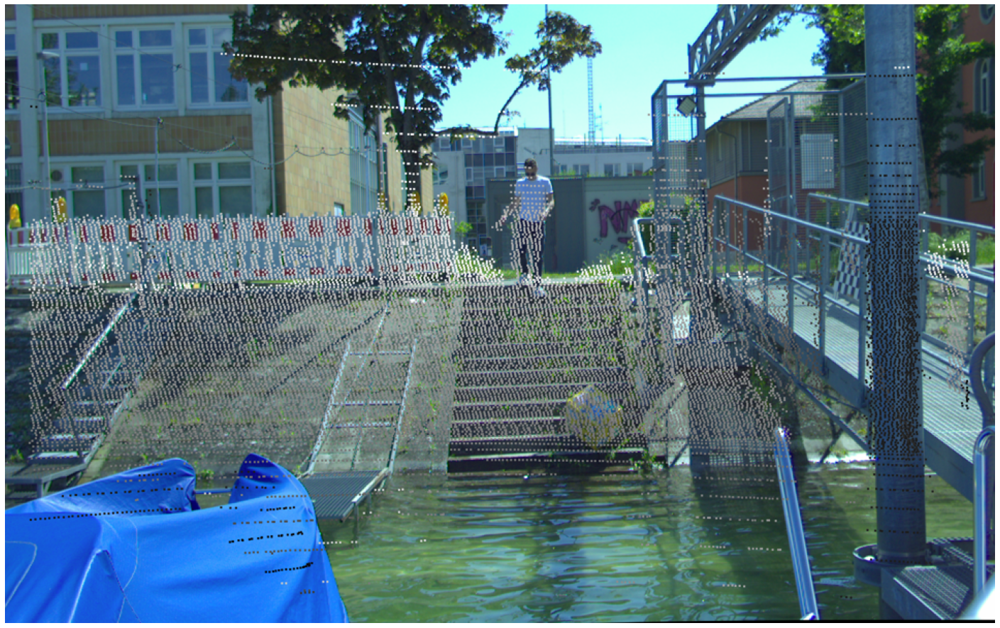

In [21]:
idx = 150 # eye
point_cloud, cam2, image3, oxts = ds[idx]
ac.max_z = 20
ac.clip_floor_3d = -5
image, x, y, z, I, mask, max_x, max_y, max_z, valid_proj_pointcloud = ac.transform_points(point_cloud, cam2, clipping=True)

cam2_ = np.asarray(cam2).copy()

x, y, z = x.int().cpu().detach().numpy(), y.cpu().int().detach().numpy(), z.cpu().detach().numpy()
z = ( z - z.min())/( z.max() -  z.min()) * 255

from itertools import product
thick = 2
for i, (x_, y_) in enumerate(product(range(-thick, thick), range(-thick, thick))):
    cam2_[y+y_, x+x_]     = np.array([z, z, z]).T

fig, ax = plt.subplots(figsize=(25, 25))

img = Image.fromarray(cam2_).resize((cam2_.shape[1]//2, cam2_.shape[0]//2))

ax.imshow(img)
ax.axis("off")

(-0.5, 958.5, 598.5, -0.5)

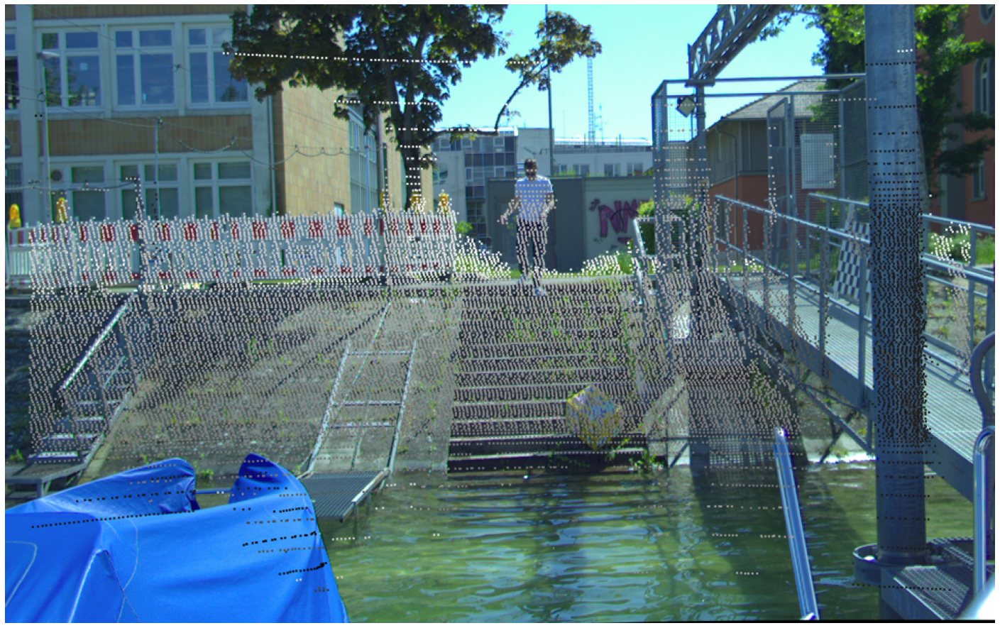

In [352]:
idx = 150 # eye
point_cloud, cam2, image3, oxts = MultiSenseData(BASE_DIR, rectified=True, crop=[0, 0, -1, -1])[idx]
ac.max_z = 20
ac.clip_floor_3d = -5
image, x, y, z, mask, max_x, max_y, max_z, valid_proj_pointcloud = ac.transform_points(point_cloud, cam2, clipping=True)

cam2_ = np.asarray(cam2).copy()

x, y, z = x.int().cpu().detach().numpy(), y.cpu().int().detach().numpy(), z.cpu().detach().numpy()
z = ( z - z.min())/( z.max() -  z.min()) * 255

from itertools import product
thick = 2
for i, (x_, y_) in enumerate(product(range(-thick, thick), range(-thick, thick))):
    cam2_[y+y_, x+x_]     = np.array([z, z, z]).T

fig, ax = plt.subplots(figsize=(25, 25))

img = Image.fromarray(cam2_).resize((cam2_.shape[1]//2, cam2_.shape[0]//2))

ax.imshow(img)
ax.axis("off")

# Seq

In [99]:
BASE_DIR = "/home/ios/data3_/multisense/"

ds = MultiSenseData(BASE_DIR, rectified=True, crop=[0, 0, -1, -1])
velo, cam_left, cam_right, _ = ds[0]
cam_right
datas = [ds]

In [13]:
eye = np.eye(3)
eye[:3, 0] = np.array([0, 0, 1])
eye[:3, 1] = np.array([-1, 0, 0])
eye[:3, 2] = np.array([0, -1, 0])

euler_diff(eye, np.load("calib/multisense_seq_27_RT_old_to_new_recentered_GT.npy")[:3, :3])

array([0.40478026, 1.82408439, 0.08884673])

(-0.5, 559.5, 299.5, -0.5)

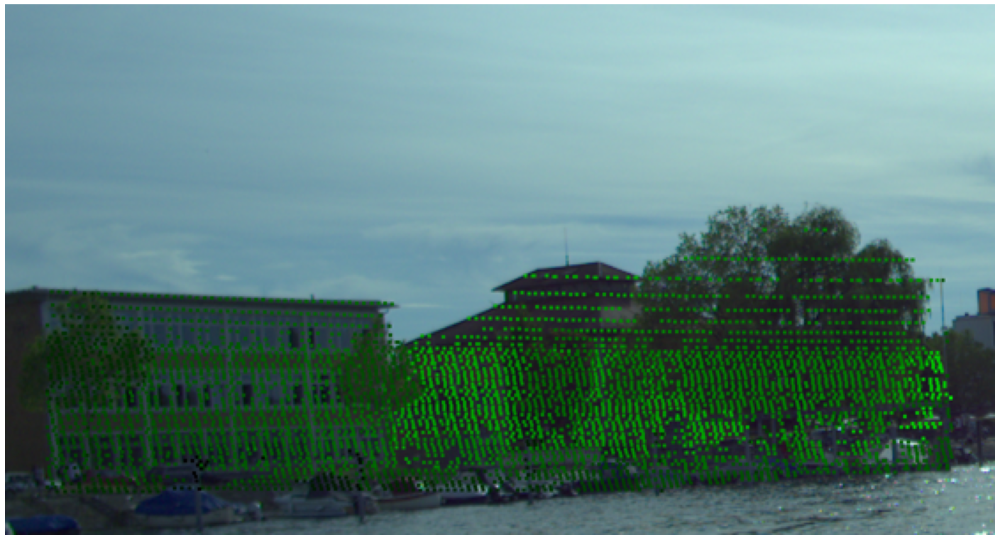

In [101]:
tst = np.load("calib/multisense_seq_27_RT_old_to_new_recentered_GT.npy")

ac = AutoCalibration(tst,                               # INITIAL CALIBRATION
                     ds.calib.P_rect_20, 
                     pc_batch=5000,  
                     M=24,       # OPTIMIZATION
                     patch_size=96, 
                     hidden_size=32,     # MODEL COMPLEXITY
                     max_z=150, 
                    )

idx = 0 # eye
point_cloud, cam2, image3, oxts = MultiSenseData(BASE_DIR, rectified=True, crop=[0, 0, -600, -800])[idx]
ac.max_z = 300
image, x, y, z, I, mask, max_x, max_y, max_z, valid_proj_pointcloud = ac.transform_points(point_cloud, cam2, clipping=True)

cam2_ = np.asarray(cam2).copy()

x, y, z = x.int().cpu().detach().numpy(), y.cpu().int().detach().numpy(), z.cpu().detach().numpy()
z = ( z- z.min())/( z.max()-  z.min()) * 255

from itertools import product
thick = 2
for i, (x_, y_) in enumerate(product(range(-thick, thick), range(-thick, thick))):
    cam2_[y+y_, x+x_]     = np.array([0*z, z, 0*z]).T

fig, ax = plt.subplots(figsize=(25, 25))


img = Image.fromarray(cam2_).resize((cam2_.shape[1]//2, cam2_.shape[0]//2))

ax.imshow(img)
ax.axis("off")

(-0.5, 559.5, 299.5, -0.5)

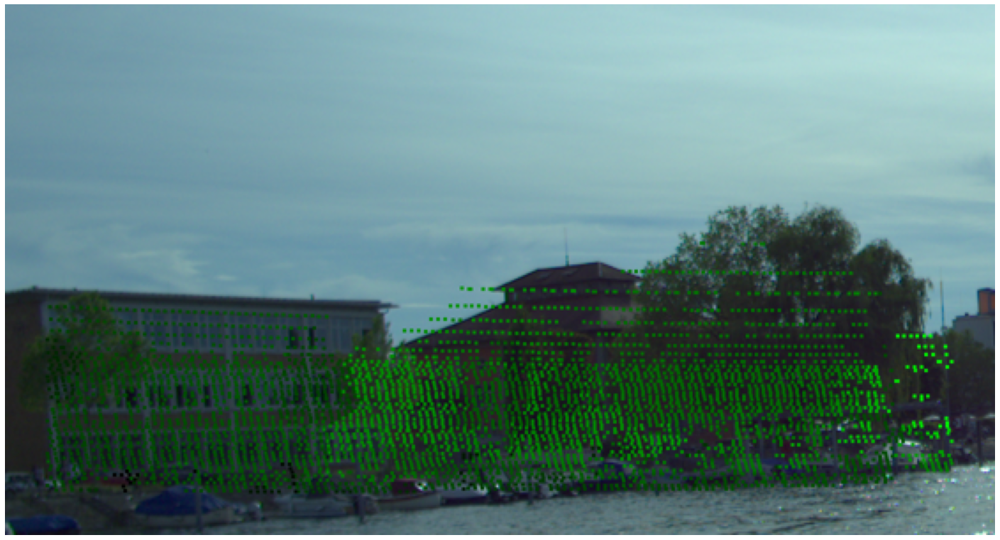

In [102]:
#tst = ds.calib.T_cam2_velo
tst = np.load("calib/multisense_seq_27_RT_old_to_new_recentered_GT.npy")
tst[:3, 0] = np.array([0, 0, 1])
tst[:3, 1] = np.array([-1, 0, 0])
tst[:3, 2] = np.array([0, -1, 0])
tst[:3, 3] = np.array([0.75, 0.05, -0.10])
ac = AutoCalibration(tst,                               # INITIAL CALIBRATION
                     ds.calib.P_rect_20, 
                     pc_batch=5000,  
                     M=24,       # OPTIMIZATION
                     patch_size=96, 
                     hidden_size=32,     # MODEL COMPLEXITY
                     max_z=150, 
                    )

idx = 0 # eye
point_cloud, cam2, image3, oxts = MultiSenseData(BASE_DIR, rectified=True, crop=[0, 0, -600, -800])[idx]
ac.max_z = 300
image, x, y, z, I, mask, max_x, max_y, max_z, valid_proj_pointcloud = ac.transform_points(point_cloud, cam2, clipping=True)

cam2_ = np.asarray(cam2).copy()

x, y, z = x.int().cpu().detach().numpy(), y.cpu().int().detach().numpy(), z.cpu().detach().numpy()
z = ( z- z.min())/( z.max()-  z.min()) * 255

from itertools import product
thick = 2
for i, (x_, y_) in enumerate(product(range(-thick, thick), range(-thick, thick))):
    cam2_[y+y_, x+x_]     = np.array([0*z, z, 0*z]).T

fig, ax = plt.subplots(figsize=(25, 25))


img = Image.fromarray(cam2_).resize((cam2_.shape[1]//2, cam2_.shape[0]//2))

ax.imshow(img)
ax.axis("off")

In [482]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

for i in range(10):

    tst = np.load("calib/multisense_seq_27_RT_old_to_new_recentered_GT.npy")


    
    ac = AutoCalibration(tst,                               # INITIAL CALIBRATION
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       # OPTIMIZATION
                         patch_size=96, 
                         hidden_size=32,     # MODEL COMPLEXITY
                         max_z=250, 
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()

    ac.distort_calibration(T = [0.001, 0.001, 0.001], R=[0.40478026, 1.82408439, 0.08884673]) # eye

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=50, log_interval=24, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=1500, log_interval=100, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-5, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=499, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    
    print("\n########################################\n")

#   0: nll: 1.08/0.80, mi: -0.804/ 0.130, acc: 47.9/59.6, eps: 0.04738, R=[0.35, 1.88, 0.14], t=0.00, Q_cos=1.92
#  24: nll: 0.98/0.81, mi: -0.863/-0.132, acc: 56.2/57.5, eps: 0.00066, R=[0.0, 1.89, -0.05], t=0.00, Q_cos=1.89
#  48: nll: 0.85/0.84, mi:  0.100/-0.328, acc: 58.3/59.2, eps: 0.00067, R=[-0.11, 1.85, -0.16], t=0.00, Q_cos=1.86
#   0: nll: 1.24/0.83, mi: -1.885/-0.356, acc: 45.8/57.9, eps: 0.00143, R=[-0.05, 1.92, -0.1], t=0.00, Q_cos=1.92
# 100: nll: 0.72/0.63, mi: -0.096/ 0.291, acc: 47.9/63.3, eps: 0.00226, R=[0.11, 1.82, 0.16], t=0.00, Q_cos=1.83
Saved checkpoint
# 200: nll: 0.59/0.56, mi:  0.511/ 0.603, acc: 68.8/68.3, eps: 0.01354, R=[-0.16, 1.26, -0.18], t=0.00, Q_cos=1.28
Saved checkpoint
# 300: nll: 0.58/0.59, mi:  0.543/ 0.453, acc: 68.8/65.4, eps: 0.00782, R=[-0.22, 1.58, 0.02], t=0.00, Q_cos=1.60
# 400: nll: 0.62/0.58, mi:  0.351/ 0.433, acc: 64.6/68.8, eps: 0.00229, R=[-0.19, 1.48, -0.19], t=0.00, Q_cos=1.50
# 500: nll: 0.50/0.54, mi:  0.933/ 0.787, acc: 70.8/68

In [500]:
r = [0.57,
0.38,
0.18,
0.17,
0.63,
5.05,
0.27,
0.32,
0.10,
1.25]

t = [0.00,
0.01,
0.01,
0.01,
0.00,
0.01,
0.01,
0.01,
0.02,
0.00,]

np.asarray([r, t]).mean(1), np.asarray([r, t]).std(1), np.median(np.asarray([r, t]), 1)

(array([0.892, 0.008]), array([1.42201125, 0.006     ]), array([0.35, 0.01]))

In [491]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

for i in range(10):

    tst = np.load("calib/multisense_seq_27_RT_old_to_new_recentered_GT.npy")


    ac = AutoCalibration(tst,                               # INITIAL CALIBRATION
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       # OPTIMIZATION
                         patch_size=96, 
                         hidden_size=32,     # MODEL COMPLEXITY
                         max_z=250, 
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()

    ac.distort_calibration(T = [0.01, 0.01, 0.01], R=[0.40478026, 1.82408439, 0.08884673]) # eye

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=50, log_interval=24, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=1500, log_interval=100, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-5, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=499, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)
    
    print("\n########################################\n")

#   0: nll: 1.06/0.83, mi: -1.156/-0.362, acc: 47.9/57.5, eps: 0.05095, R=[0.46, 1.88, 0.15], t=0.02, Q_cos=1.94
#  24: nll: 1.04/0.75, mi: -1.523/ 0.313, acc: 52.1/59.2, eps: 0.00023, R=[0.46, 1.9, -0.08], t=0.02, Q_cos=1.96
#  48: nll: 1.25/0.78, mi: -1.786/-0.327, acc: 45.8/56.7, eps: 0.00668, R=[0.32, 1.6, -0.31], t=0.02, Q_cos=1.67
#   0: nll: 0.82/0.75, mi:  0.469/-0.232, acc: 64.6/62.1, eps: 0.00099, R=[0.26, 1.65, -0.36], t=0.02, Q_cos=1.71
# 100: nll: 0.66/0.59, mi:  0.168/ 0.452, acc: 60.4/67.5, eps: 0.01790, R=[-0.06, 2.12, -1.27], t=0.02, Q_cos=2.47
Saved checkpoint
# 200: nll: 0.60/0.57, mi:  0.367/ 0.573, acc: 64.6/70.8, eps: 0.00726, R=[0.11, 1.97, -0.88], t=0.02, Q_cos=2.16
Saved checkpoint
# 300: nll: 0.55/0.52, mi:  0.454/ 0.766, acc: 79.2/72.9, eps: 0.00033, R=[-0.23, 1.82, -1.17], t=0.02, Q_cos=2.18
Saved checkpoint
# 400: nll: 0.62/0.57, mi:  0.182/ 0.446, acc: 68.8/72.1, eps: 0.01631, R=[-0.19, 1.32, -0.67], t=0.02, Q_cos=1.49
# 500: nll: 0.46/0.52, mi:  1.054/ 0.

In [501]:
r = [0.39,
0.49,
0.49,
4.52,
0.72,
2.57,
0.05,
0.16,
0.19,
0.16]

t = [0.01,
0.02,
0.01,
0.02,
0.02,
0.02,
0.04,
0.02,
0.04,
0.02]

np.asarray([r, t]).mean(1), np.asarray([r, t]).std(1), np.median(np.asarray([r, t]), 1)

(array([0.974, 0.022]), array([1.37073119, 0.00979796]), array([0.44, 0.02]))

In [489]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

for i in range(10):

    tst = np.load("calib/multisense_seq_27_RT_old_to_new_recentered_GT.npy")

    ac = AutoCalibration(tst,                               # INITIAL CALIBRATION
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       # OPTIMIZATION
                         patch_size=96, 
                         hidden_size=32,     # MODEL COMPLEXITY
                         max_z=250, 
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()

    ac.distort_calibration(T = [0.025, 0.025, 0.025], R=[0.40478026, 1.82408439, 0.08884673]) # eye

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=50, log_interval=24, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=1500, log_interval=100, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-5, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=499, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    
    print("\n########################################\n")

#   0: nll: 0.93/0.72, mi: -0.608/ 0.505, acc: 56.2/63.3, eps: 0.06428, R=[0.35, 1.88, 0.14], t=0.04, Q_cos=1.92
#  24: nll: 0.88/0.70, mi: -1.660/ 0.239, acc: 58.3/62.9, eps: 0.00812, R=[0.29, 2.28, 0.21], t=0.04, Q_cos=2.31
#  48: nll: 0.77/0.73, mi:  0.493/ 0.158, acc: 72.9/59.2, eps: 0.00176, R=[0.1, 2.37, 0.25], t=0.05, Q_cos=2.38
#   0: nll: 1.05/0.76, mi: -1.287/ 0.073, acc: 52.1/60.0, eps: 0.00146, R=[0.15, 2.43, 0.3], t=0.05, Q_cos=2.46
# 100: nll: 0.55/0.59, mi:  0.696/ 0.467, acc: 66.7/67.5, eps: 0.01350, R=[-0.05, 3.08, 0.02], t=0.05, Q_cos=3.09
# 200: nll: 0.70/0.58, mi: -0.183/ 0.483, acc: 45.8/68.3, eps: 0.00382, R=[-0.11, 3.25, -0.11], t=0.05, Q_cos=3.25
# 300: nll: 0.67/0.60, mi:  0.198/ 0.359, acc: 62.5/64.6, eps: 0.00191, R=[-0.2, 3.25, -0.62], t=0.05, Q_cos=3.31
# 400: nll: 0.56/0.56, mi:  0.653/ 0.604, acc: 66.7/71.7, eps: 0.01721, R=[0.09, 4.04, -0.46], t=0.05, Q_cos=4.07
Saved checkpoint
# 500: nll: 0.59/0.53, mi:  0.308/ 0.652, acc: 79.2/75.8, eps: 0.01522, R=[-

In [502]:
r = [5.61,
0.04,
0.05,
0.40,
0.15,
0.22,
5.00,
5.25,
0.39,
0.65]

t = [0.05,
0.06,
0.04,
0.04,
0.04,
0.05,
0.05,
0.05,
0.05,
0.04]

np.asarray([r, t]).mean(1), np.asarray([r, t]).std(1), np.median(np.asarray([r, t]), 1)

(array([1.776, 0.047]), array([2.30873212, 0.00640312]), array([0.395, 0.05 ]))

In [490]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

for i in range(10):

    tst = np.load("calib/multisense_seq_27_RT_old_to_new_recentered_GT.npy")

    ac = AutoCalibration(tst,                               # INITIAL CALIBRATION
                         ds.calib.P_rect_20, 
                         pc_batch=5000,  
                         M=24,       # OPTIMIZATION
                         patch_size=96, 
                         hidden_size=32,     # MODEL COMPLEXITY
                         max_z=250, 
                        )
    ac.to("cuda")

    ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small_registered.pth.tar"))
    ac.MINE.load_state_dict(torch.load("checkpoints/mi_model_p96_small_2000/MINE_3999.pth.tar"))
    ac.reset_calibration()

    ac.distort_calibration(T = [0.05, 0.05, 0.05], R=[0.40478026, 1.82408439, 0.08884673]) # eye

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=50, log_interval=24, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-3, lr_R=1e-3, lr_T=1e-4)
    r = ac.fit(datas, iters=1500, log_interval=100, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.update_se_and_mine(lr_mi=1e-4, lr_R=1e-5, lr_T=1e-5)
    r = ac.fit(datas, iters=1000, log_interval=499, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    
    print("\n########################################\n")

#   0: nll: 0.92/0.86, mi: -0.474/-0.403, acc: 52.1/52.5, eps: 0.09774, R=[0.46, 1.77, 0.15], t=0.09, Q_cos=1.83
#  24: nll: 0.80/0.81, mi:  0.079/ 0.207, acc: 62.5/62.5, eps: 0.00079, R=[0.88, 1.72, 0.07], t=0.09, Q_cos=1.93
#  48: nll: 0.92/0.77, mi: -0.881/ 0.188, acc: 50.0/62.9, eps: 0.00105, R=[0.47, 1.88, -0.2], t=0.09, Q_cos=1.95
#   0: nll: 1.14/0.92, mi: -1.026/-0.481, acc: 47.9/51.7, eps: 0.00079, R=[0.42, 1.81, -0.28], t=0.09, Q_cos=1.88
# 100: nll: 0.62/0.60, mi:  0.283/ 0.406, acc: 64.6/67.1, eps: 0.00423, R=[-0.22, 2.1, -0.34], t=0.09, Q_cos=2.14
Saved checkpoint
# 200: nll: 0.62/0.63, mi:  0.214/ 0.222, acc: 66.7/63.3, eps: 0.00624, R=[-0.16, 1.59, 0.14], t=0.09, Q_cos=1.60
# 300: nll: 0.65/0.57, mi:  0.008/ 0.513, acc: 58.3/70.8, eps: 0.00571, R=[-0.12, 0.97, -0.15], t=0.09, Q_cos=0.99
Saved checkpoint
# 400: nll: 0.55/0.55, mi:  0.644/ 0.687, acc: 64.6/72.5, eps: 0.00202, R=[-0.15, 1.24, -0.51], t=0.09, Q_cos=1.34
Saved checkpoint
# 500: nll: 0.58/0.56, mi:  0.558/ 0.6

In [503]:
# 998: nll: 0.44/0.37, mi:  1.528/ 1.695, acc: 77.1/82.1, eps: 0.00010, R=[-0.33, 0.19, 0.16], t=0.08, Q_cos=0.42
# 998: nll: 0.41/0.39, mi:  1.158/ 1.551, acc: 81.2/81.7, eps: 0.00023, R=[-0.16, 0.09, -0.17], t=0.08, Q_cos=0.26
# 998: nll: 0.52/0.36, mi:  0.727/ 1.744, acc: 77.1/81.7, eps: 0.00045, R=[0.05, 0.12, -0.1], t=0.08, Q_cos=0.16
# 998: nll: 0.46/0.40, mi:  1.083/ 1.336, acc: 77.1/81.7, eps: 0.00024, R=[-0.27, 0.42, -0.12], t=0.09, Q_cos=0.52
# 998: nll: 0.51/0.43, mi:  0.863/ 1.206, acc: 72.9/79.6, eps: 0.00043, R=[-0.1, 1.88, -0.67], t=0.09, Q_cos=2.00
# 998: nll: 0.40/0.33, mi:  1.638/ 1.959, acc: 79.2/85.4, eps: 0.00016, R=[-0.13, 0.07, -0.23], t=0.09, Q_cos=0.27
# 998: nll: 0.31/0.35, mi:  2.231/ 1.627, acc: 87.5/84.6, eps: 0.00039, R=[-0.47, 0.21, -0.18], t=0.09, Q_cos=0.55
# 998: nll: 0.37/0.38, mi:  1.396/ 1.605, acc: 85.4/82.5, eps: 0.00010, R=[-0.23, 0.08, -0.34], t=0.08, Q_cos=0.42
# 998: nll: 0.34/0.35, mi:  2.109/ 1.612, acc: 83.3/85.4, eps: 0.00019, R=[-0.18, -0.03, -0.26], t=0.09, Q_cos=0.31
# 998: nll: 0.53/0.40, mi:  1.071/ 1.427, acc: 70.8/81.7, eps: 0.00010, R=[-0.03, 0.13, -0.05], t=0.08, Q_cos=0.14

r = [
 0.42
,0.26
,0.16
,0.52
,2.00
,0.27
,0.55
,0.42
,0.31
,0.14]

t = [
0.08
,0.08
,0.08
,0.09
,0.09
,0.09
,0.09
,0.08
,0.09
,0.08]

np.asarray([r, t]).mean(1), np.asarray([r, t]).std(1), np.median(np.asarray([r, t]), 1)

(array([0.505, 0.085]), array([0.51548521, 0.005     ]), array([0.365, 0.085]))

In [50]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.load("./calib/multisense_seq_27_RT_old_to_new_recentered_GT.npy")
    
    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         M=24,
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2,
                         mode="euclidean",
                         rgb_channels=1,
                         pc_batch=5000)
    ac.to("cuda")
    
    r, t = randomRT(0.0001, 2.)
    
    ac.load_and_reset("checkpoints/mi_model_p96_small_registered_3999.pth.tar")

    print(r ,t)
    ac.distort_calibration(t, r)
    
    ac.update_se_and_mine(lr_mi=1e-5, lr_R=1e-4, lr_T=1e-5)
    res = ac.fit(datas, iters=10, log_interval=10, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.increase_lr()
    res = ac.fit(datas, iters=2500, log_interval=10, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.reduce_lr()
    res = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)
    
    log.append(res)
    print("\n########################################\n")
    
t, r = np.asarray([l[-1]["t_l2"].tail(1).item() for l in log]), np.asarray([l[-1]["Q_cos"].tail(1).item()for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

[ 1.26467319 -0.84165287  0.93250391] [-3.80204831e-05  3.42905290e-05 -5.75404435e-06]
#   0: nll: 0.94/1.00, mi: -0.189/-0.959, acc: 56.2/52.0, eps: 0.04423, R=[1.27, -0.84, 0.94], t=0.00, Q_cos=1.79
Saved checkpoint.
#   0: nll: 0.87/0.96, mi: -0.580/-1.265, acc: 56.2/54.5, eps: 0.00037, R=[1.29, -0.81, 0.97], t=0.00, Q_cos=1.81
#  10: nll: 1.26/1.06, mi: -1.664/-1.462, acc: 45.8/48.7, eps: 0.00195, R=[1.38, -0.62, 1.12], t=0.00, Q_cos=1.89
#  20: nll: 0.88/0.97, mi: -0.020/-0.905, acc: 56.2/48.9, eps: 0.00124, R=[1.36, -0.58, 1.07], t=0.00, Q_cos=1.84
Saved checkpoint.
#  30: nll: 0.84/0.94, mi: -0.448/-1.114, acc: 56.2/52.3, eps: 0.00292, R=[1.28, -0.71, 0.9], t=0.00, Q_cos=1.72
#  40: nll: 0.97/0.93, mi: -0.504/-0.815, acc: 52.1/50.2, eps: 0.00520, R=[1.09, -0.72, 0.73], t=0.00, Q_cos=1.51
Saved checkpoint.
#  50: nll: 1.07/0.88, mi: -0.715/-0.461, acc: 50.0/53.7, eps: 0.00112, R=[1.05, -0.78, 0.64], t=0.00, Q_cos=1.46
Saved checkpoint.
#  60: nll: 1.03/0.85, mi: -0.995/-0.305, a

Result(mean_t=0.010411203573295802, std_t=0.0028334872683582826, median_t=0.011717660078563171, mean_R=0.1718697091818989, std_R=0.10987293059338728, meadian_R=0.17387962318267328)

In [ ]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.load("./calib/multisense_seq_27_RT_old_to_new_recentered_GT.npy")
    
    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         M=24,
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2,
                         mode="euclidean",
                         rgb_channels=1,
                         pc_batch=5000)
    ac.to("cuda")
    
    r, t = randomRT(0.02, 2.)
    
    ac.load_and_reset("checkpoints/mi_model_p96_small_registered_3999.pth.tar")

    print(r ,t)
    ac.distort_calibration(t, r)
    
    ac.update_se_and_mine(lr_mi=1e-5, lr_R=1e-4, lr_T=1e-5)
    res = ac.fit(datas, iters=10, log_interval=10, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.increase_lr()
    res = ac.fit(datas, iters=2500, log_interval=10, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.reduce_lr()
    res = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)
    
    log.append(res)
    print("\n########################################\n")
    
t, r = np.asarray([l[-1]["t_l2"].tail(1).item() for l in log]), np.asarray([l[-1]["Q_cos"].tail(1).item()for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

[ 1.26467319 -0.84165287  0.93250391] [-0.0076041   0.00685811 -0.00115081]
#   0: nll: 1.02/0.98, mi: -0.641/-1.225, acc: 50.0/50.5, eps: 0.04507, R=[1.26, -0.84, 0.93], t=0.01, Q_cos=1.78
Saved checkpoint.
#   0: nll: 1.06/0.95, mi: -1.209/-1.070, acc: 50.0/51.2, eps: 0.00103, R=[1.23, -0.85, 0.87], t=0.01, Q_cos=1.73
Saved checkpoint.
#  10: nll: 0.94/0.93, mi: -0.451/-0.548, acc: 54.2/55.1, eps: 0.00277, R=[1.15, -0.87, 0.72], t=0.01, Q_cos=1.61
Saved checkpoint.
#  20: nll: 0.95/0.92, mi: -0.721/-0.485, acc: 58.3/53.3, eps: 0.00344, R=[1.08, -0.78, 0.61], t=0.01, Q_cos=1.47
Saved checkpoint.
#  30: nll: 1.02/0.90, mi: -0.398/-0.439, acc: 52.1/52.6, eps: 0.00244, R=[1.03, -0.75, 0.5], t=0.01, Q_cos=1.37
Saved checkpoint.
#  40: nll: 0.59/0.92, mi:  0.688/-0.621, acc: 70.8/53.1, eps: 0.00003, R=[1.06, -0.72, 0.45], t=0.01, Q_cos=1.37
#  50: nll: 0.90/0.87, mi: -0.224/-0.660, acc: 50.0/53.3, eps: 0.00261, R=[1.15, -0.77, 0.5], t=0.01, Q_cos=1.48
#  60: nll: 0.93/0.93, mi: -0.398/-0.6

In [53]:
t, r = np.asarray([l[-1]["t_l2"].tail(1).item() for l in log]), np.asarray([l[-1]["Q_cos"].tail(1).item()for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

Result(mean_t=0.017500396034928832, std_t=0.012524320851160746, median_t=0.010355267187005645, mean_R=0.1985822753077072, std_R=0.1597873980964621, meadian_R=0.1532952754981286)

In [54]:
from AutoCalibration import *

np.random.seed(12)
torch.manual_seed(12)

log = []
for i in range(5):

    cal =  ds.calib.T_cam2_velo
    cal = np.load("./calib/multisense_seq_27_RT_old_to_new_recentered_GT.npy")
    
    ac = AutoCalibration(cal,                               
                         ds.calib.P_rect_20, 
                         M=24,
                         patch_size=96, 
                         hidden_size=32,     
                         max_z=250,
                         clip_floor_3d = -2,
                         mode="euclidean",
                         rgb_channels=1,
                         pc_batch=5000)
    ac.to("cuda")
    
    r, t = randomRT(0.06, 2.)
    
    ac.load_and_reset("checkpoints/mi_model_p96_small_registered_3999.pth.tar")

    print(r ,t)
    ac.distort_calibration(t, r)
    
    ac.update_se_and_mine(lr_mi=1e-5, lr_R=1e-4, lr_T=1e-5)
    res = ac.fit(datas, iters=10, log_interval=10, viz="none", grad_mine=False, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.increase_lr()
    res = ac.fit(datas, iters=2500, log_interval=10, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)

    ac.reduce_lr()
    res = ac.fit(datas, iters=1000, log_interval=50, viz="none", grad_mine=True, grad_SE=True, valid_ratio=0.1, log_avg_window=1, eps=1e-8)
    
    log.append(res)
    print("\n########################################\n")
    
t, r = np.asarray([l[-1]["t_l2"].tail(1).item() for l in log]), np.asarray([l[-1]["Q_cos"].tail(1).item()for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

[ 1.26467319 -0.84165287  0.93250391] [-0.02281229  0.02057432 -0.00345243]
#   0: nll: 1.11/0.94, mi: -1.419/-1.091, acc: 45.8/53.1, eps: 0.05378, R=[1.26, -0.85, 0.93], t=0.03, Q_cos=1.78
Saved checkpoint.
#   0: nll: 0.87/1.02, mi: -0.428/-1.157, acc: 56.2/52.2, eps: 0.00014, R=[1.27, -0.82, 0.95], t=0.03, Q_cos=1.79
#  10: nll: 1.28/0.92, mi: -1.574/-0.862, acc: 41.7/55.4, eps: 0.00276, R=[1.19, -0.65, 0.94], t=0.03, Q_cos=1.66
Saved checkpoint.
#  20: nll: 1.00/0.83, mi: -0.540/-0.195, acc: 47.9/58.2, eps: 0.00268, R=[1.09, -0.56, 0.9], t=0.03, Q_cos=1.52
Saved checkpoint.
#  30: nll: 0.85/0.88, mi: -0.423/-0.849, acc: 52.1/52.7, eps: 0.00253, R=[1.18, -0.68, 0.92], t=0.03, Q_cos=1.65
#  40: nll: 1.08/0.91, mi: -0.990/-0.732, acc: 45.8/53.2, eps: 0.00442, R=[1.35, -0.77, 1.03], t=0.03, Q_cos=1.87
#  50: nll: 1.04/1.03, mi: -0.825/-1.310, acc: 54.2/50.5, eps: 0.00439, R=[1.5, -0.77, 1.21], t=0.03, Q_cos=2.08
#  60: nll: 1.17/1.05, mi: -1.400/-1.021, acc: 43.8/48.8, eps: 0.00388, R=

Result(mean_t=0.05005237191174396, std_t=0.01436657706985708, median_t=0.05572335034087893, mean_R=0.3555530461994071, std_R=0.47830744294235816, meadian_R=0.11566492370778587)

In [55]:
t, r = np.asarray([l[-1]["t_l2"].tail(1).item() for l in log]), np.asarray([l[-1]["Q_cos"].tail(1).item()for l in log])
Result = namedtuple("Result", "mean_t std_t median_t mean_R std_R meadian_R")
Result(t.mean(), t.std(), np.median(t), r.mean(), r.std(), np.median(r))

Result(mean_t=0.05005237191174396, std_t=0.01436657706985708, median_t=0.05572335034087893, mean_R=0.3555530461994071, std_R=0.47830744294235816, meadian_R=0.11566492370778587)

# Debug

In [146]:
cal = np.load("./calib/multisense_seq_stereo_TR_icp_dist_to_new_improved_GT.npy")

ac = AutoCalibration(cal,                               
                     ds.calib.P_rect_20, 
                     M=50,       
                     patch_size=96, 
                     hidden_size=32,     
                     max_z=50,
                     clip_floor_3d = -5,
                     mode="euclidean",
                     rgb_channels=1,
                    )

ac.to("cuda")
ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small.pth.tar"))
ac.reset_calibration()

In [147]:
s = 15
J = 2
MI = np.zeros((J, 2, s, s))

for j in range(J):

    xx = np.linspace(-0.05, 0.05, s)
    yy = np.linspace(-0.05, 0.05, s)

    for i,(x, y) in enumerate(product(xx, yy)):

        ac.reset_calibration()
        t = np.array([x,y,0])
        r = np.array([0,0,0])
        ac.distort_calibration(t, r)

        loss, mi_lb, acc, pred = ac.step(datas[0], 10, 11, batch_size=50, grad_se=False, viz="none", 
                                         RT=None, P=None, grad_T=False, grad_R=False)

        MI[j, 0, i // s, i % s] = loss.detach().cpu().numpy()
        MI[j, 1, i // s, i % s] = mi_lb.detach().cpu().numpy()
        
        
    for iters, lr in [(1, 1e-3)]:

        ac.update_se_and_mine(lr_mi=lr, lr_R=lr, lr_T=10*lr)
        r = ac.fit(datas, iters=iters, log_interval=30, viz="none", 
                   log_avg_window=1,
                   n_test_batches=10, 
                   valid_ratio=0.2, 
                   grad_SE=True, 
                   grad_R=True,
                   grad_T=True)

#   0: nll: 0.37/0.47, mi:  1.615/ 0.988, acc: 83.0/80.9, eps: 0.07284, R=[0.06, 0.06, 0.06], t=0.07, Q_cos=0.10
Saved checkpoint.
#   0: nll: 0.63/0.31, mi:  1.013/ 2.559, acc: 79.0/88.7, eps: 0.01534, R=[0.06, -0.06, 0.06], t=0.06, Q_cos=0.10
Saved checkpoint.


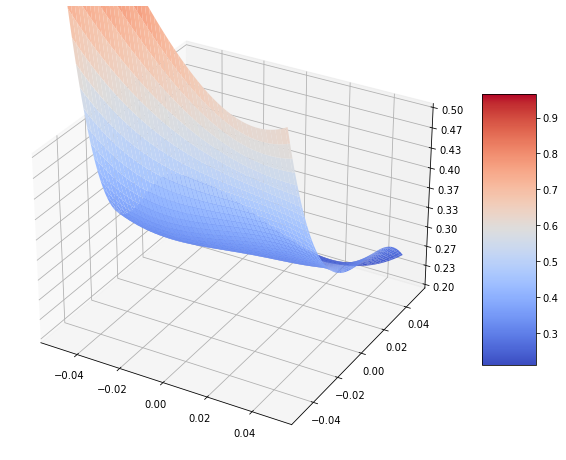

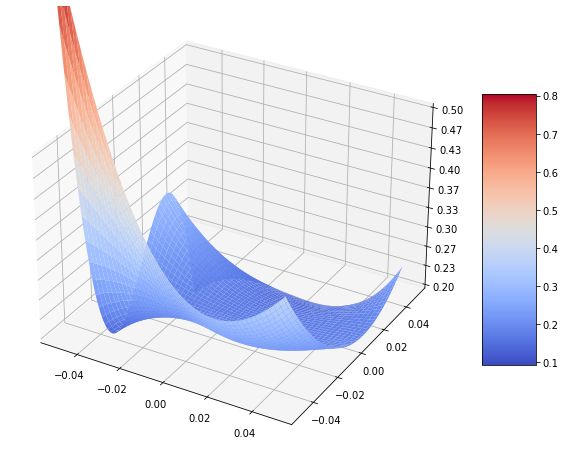

In [148]:
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator
import numpy as np
from scipy import interpolate

plt.rcParams["figure.figsize"] = (10, 10)

for j in range(J):

    fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

    # Make data.
    X, Y = np.meshgrid(xx, yy)
    Z =  MI[j, 0]

    xnew, ynew = np.mgrid[-0.05:0.05:100j, -0.05:0.05:100j]
    tck = interpolate.bisplrep(X, Y, Z, s=2)
    znew = interpolate.bisplev(xnew[:,0], ynew[0,:], tck)

    
    # Plot the surface.
    surf = ax.plot_surface(xnew, ynew, znew, cmap=plt.cm.coolwarm,
                           linewidth=0, antialiased=True)

    # Customize the z axis.
    ax.set_zlim(0.2, 0.5)
    ax.zaxis.set_major_locator(LinearLocator(10))

    # A StrMethodFormatter is used automatically
    ax.zaxis.set_major_formatter('{x:.02f}')

    # Add a color bar which maps values to colors.
    fig.colorbar(surf, shrink=0.5, aspect=5)

   
    plt.show()

In [158]:
s = 15
J = 2
MI = np.zeros((J, 2, s))
iters = 1

for j in range(J):

    xx = np.linspace(-0.10, 0.10, s)

    for i,x in enumerate(xx):

        ac.reset_calibration()
        t = np.array([0,x,0])
        r = np.array([0,0,0])
        ac.distort_calibration(t, r)

        loss, mi_lb, acc, pred = ac.step(datas[0], 10, 11, batch_size=50, grad_se=False, viz="none", 
                                         RT=None, P=None, grad_T=False, grad_R=False)

        MI[j, 0, i] = loss.detach().cpu().numpy()
        MI[j, 1, i] = mi_lb.detach().cpu().numpy()
        
        
    for iters, lr in [(1, 1e-3)]:
        ac.load_state_dict(torch.load("checkpoints/mi_model_p96_small.pth.tar"))
        ac.reset_calibration()
            
        ac.update_se_and_mine(lr_mi=lr, lr_R=lr, lr_T=10*lr)
        r = ac.fit(datas, iters=iters, log_interval=30, viz="none", 
                   log_avg_window=1,
                   n_test_batches=10, 
                   valid_ratio=0.2, 
                   grad_SE=True, 
                   grad_R=True,
                   grad_T=True)

#   0: nll: 0.86/1.05, mi: -0.554/-1.107, acc: 54.2/51.3, eps: 0.00000, R=[-0.06, 0.06, 0.06], t=0.02, Q_cos=0.10
Fitting has converged 4.7092808819204635e-11 < 1e-08
#   0: nll: 1.01/1.08, mi: -0.669/-1.106, acc: 47.9/51.2, eps: 0.00000, R=[-0.06, 0.06, -0.06], t=0.02, Q_cos=0.10
Fitting has converged 3.3036108570971834e-12 < 1e-08


/home/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:20: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
/home/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:38: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


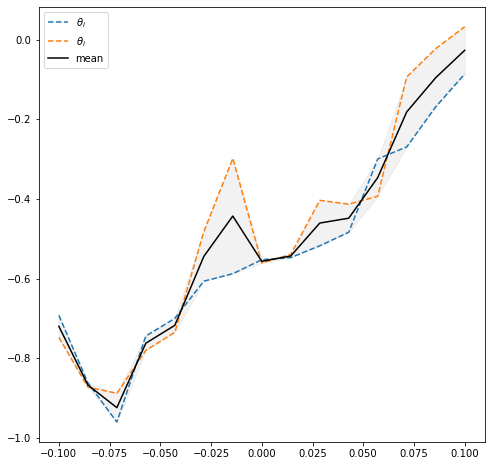

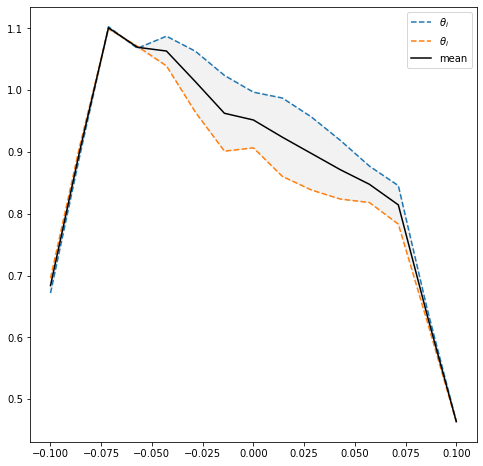

In [159]:
plt.rcParams["figure.figsize"] = (8,8)
N = 5

j = 1
fig, ax = plt.subplots()

res = np.asarray([np.convolve(MI[i, j], np.ones(N)/N, mode='same') for i in range(len(MI))])

ci = res.std(0)
m = res.mean(0)

N = 5
for i in range(0,J, 1):
    y = res[i]
    ax.plot(xx,  y, "--", label=f"$\\theta_i$")

ax.plot(xx,  m, "black", label="mean")    
ax.fill_between(xx, (m-ci), (m+ci), color='gray', alpha=.1)
ax.legend()
fig.show()

j = 0
fig, ax = plt.subplots()

res = np.asarray([np.convolve(MI[i, j], np.ones(N)/N, mode='same') for i in range(len(MI))])

ci = res.std(0)
m = res.mean(0)

N = 5
for i in range(0,J, 1):
    y = res[i]
    ax.plot(xx,  y, "--", label=f"$\\theta_i$")

ax.plot(xx,  m, "black", label="mean")    
ax.fill_between(xx, (m-ci), (m+ci), color='gray', alpha=.1)
ax.legend()
fig.show()